In [2]:
!pip3 install wordcloud

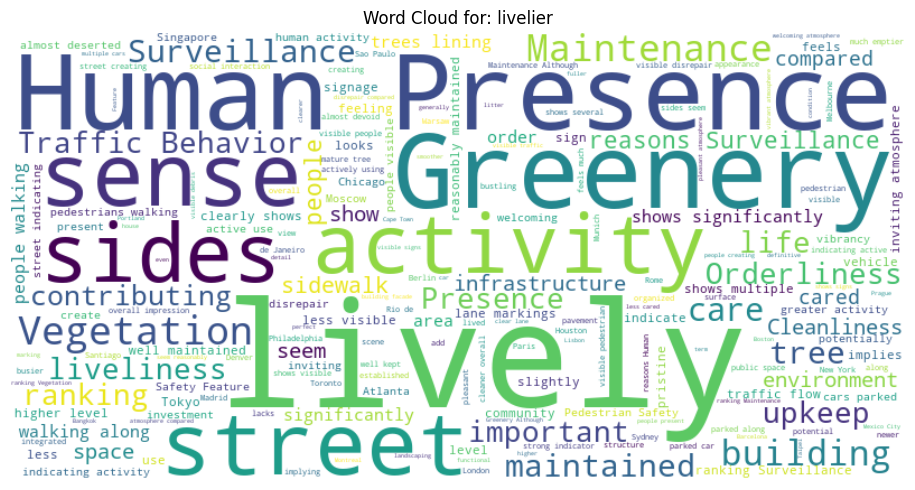

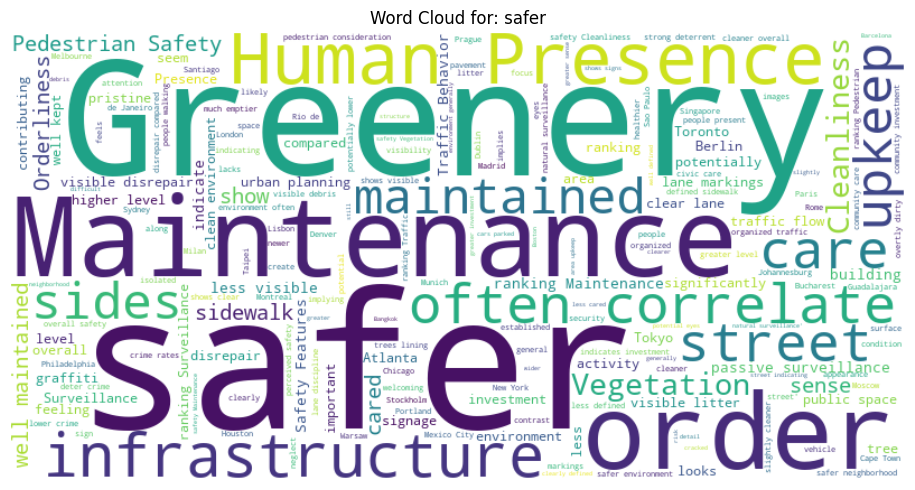

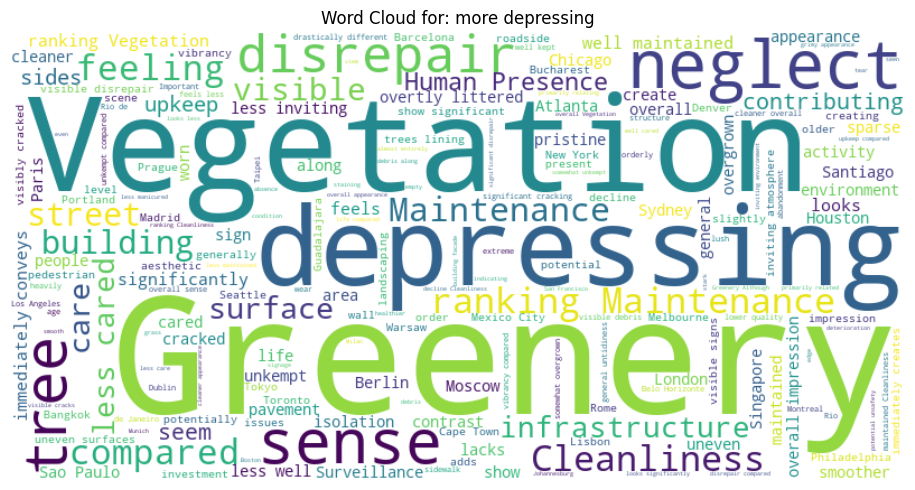

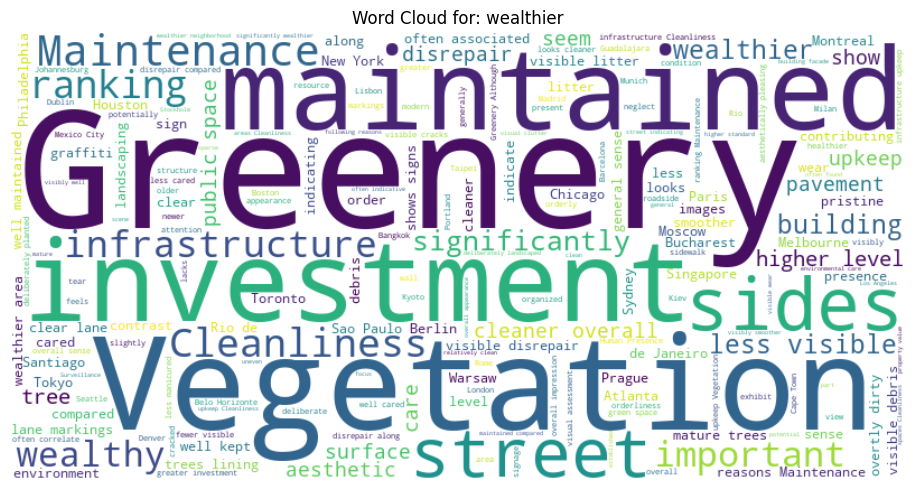

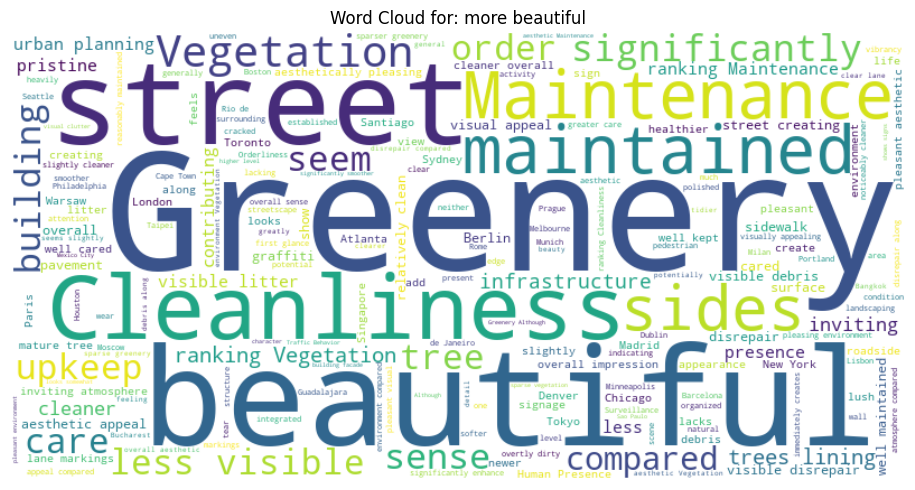

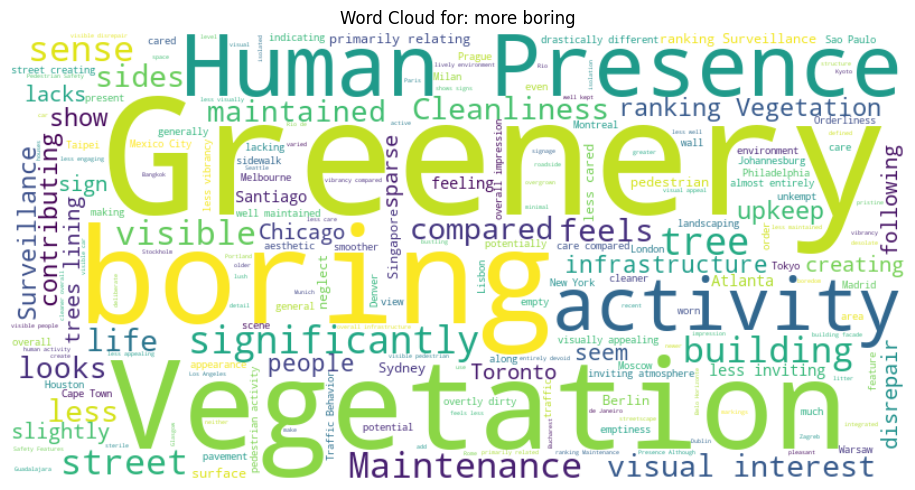

In [16]:
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Load your file
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all.csv")

# Normalize study_question
df["study_question"] = df["study_question"].str.strip().str.lower()

# Define full stopword set (default + custom)
custom_stopwords = STOPWORDS.union({
    "take", "off", "word", "left", "right", "side", "provided", "image", "combination", "due", "lack", "appear", "factors", "suggest", "suggesting", "better", "road", "roads", "based", "appears", "suggests", "look", "feel", "contribute", "contributes"
})

# Generate word clouds per class
for question in df["study_question"].unique():
    text = " ".join(df[df["study_question"] == question]["model_reason"].dropna().astype(str))
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color="white",
        stopwords=custom_stopwords
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for: {question}")
    plt.tight_layout()
    plt.show()



In [17]:
from openai import OpenAI
import os
import pandas as pd
import base64
import io
from PIL import Image
import os
import json
import re

# Point to the local server
client = OpenAI(base_url="http://localhost:1234/v1", api_key="lm-studio")
print(client.models.list())
model_name = 'google/gemma-3-27b'
output_dir = f"results_{model_name}"

SyncPage[Model](data=[Model(id='google/gemma-3-27b', created=None, object='model', owned_by='organization_owner'), Model(id='qwen/qwen2.5-vl-7b', created=None, object='model', owned_by='organization_owner'), Model(id='text-embedding-nomic-embed-text-v1.5@q4_k_m', created=None, object='model', owned_by='organization_owner'), Model(id='gemma-3-4b-it-qat', created=None, object='model', owned_by='organization_owner'), Model(id='llava-v1.5-7b', created=None, object='model', owned_by='organization_owner'), Model(id='granite-vision-3.2-2b', created=None, object='model', owned_by='organization_owner'), Model(id='text-embedding-nomic-embed-text-v1.5@q8_0', created=None, object='model', owned_by='organization_owner')], object='list')


In [ ]:
# Load metadata
prompt_method = "Zero-shot1-GEO"
prediction_df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all.csv")
logic_chains = []

for _, row in prediction_df.iterrows():
    model_reason = row["model_reason"]
    study_question = row["study_question"]
    # Compose LLM prompt
    chain_prompt = f"""
                    You were comparing two street view images to determine which one better reflects the following quality:

                    "{study_question}"

                    Based on your explanation, break down your reasoning into a clear step-by-step logic chain.

                    Format: Step 1 → Step 2 → Step 3 → ... (as many steps as needed)

                    Explanation: {model_reason}
                    """
    # Call LLM 
    response = client.chat.completions.create(
        model= model_name,
        messages=[
            {
                "role": "user",
                "content": [{"type": "text", "text": chain_prompt.strip()}],
            },
        ],
        
    )
    raw = response.choices[0].message.content.strip()
    print(raw)
    logic_chains.append(raw)

# Append new column to original DataFrame
df["logic_chain"] = logic_chains

# Overwrite or save as new file
df.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_explanation.csv", index=False)  # Overwrite
# df.to_csv("updated_with_logic_chain.csv", index=False)  # Optional: save as new file

Okay, here's the breakdown of my reasoning into a step-by-step logic chain, based on the provided explanation for determining which street view image is "livelier":

**Step 1 → Define "Livelier" in a Street View Context:** The core concept of “livelier” when applied to a street view implies a sense of activity, vibrancy, and human presence. It's not just *being* populated, but also suggesting an area people *want* to be in.

**Step 2 → Identify Key Visual Indicators of Activity:**  To assess liveliness from a static image, we look for proxies like:
    * **Number of People:** More pedestrians generally indicate more activity.
    * **Vehicle Presence/Use:** Parked and moving cars suggest the street is being utilized.
    * **Signs of Recent Use:** Cleanliness, well-maintained spaces imply ongoing activity (people are *using* it enough to require upkeep).

**Step 3 → Observe Image Feature: Human Presence & Vehicle Count - Paris Side:** The Paris side image demonstrably shows a significa